<a href="https://colab.research.google.com/github/Emma-Cap/Deep-Learning-Project/blob/main/PROVA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Directory already exists: /content/simplified_dataset_finale
Number of images: 9000
Number of annotations: 9000
Number of categories: 10
Categories present in the dataset:
- ID: 1, Name: person
- ID: 3, Name: car
- ID: 10, Name: traffic light
- ID: 31, Name: handbag
- ID: 44, Name: bottle
- ID: 47, Name: cup
- ID: 51, Name: bowl
- ID: 62, Name: chair
- ID: 67, Name: dining table
- ID: 84, Name: book
Initial distribution of annotations per category:
- book: 505
- bottle: 435
- cup: 377
- person: 1725
- bowl: 357
- dining table: 321
- handbag: 237
- chair: 474
- car: 560
- traffic light: 469
Final distribution of annotations per category:
- person: 900
- dining table: 321
- car: 560
- traffic light: 469
- bottle: 435
- cup: 377
- bowl: 357
- book: 505
- chair: 474
- handbag: 237


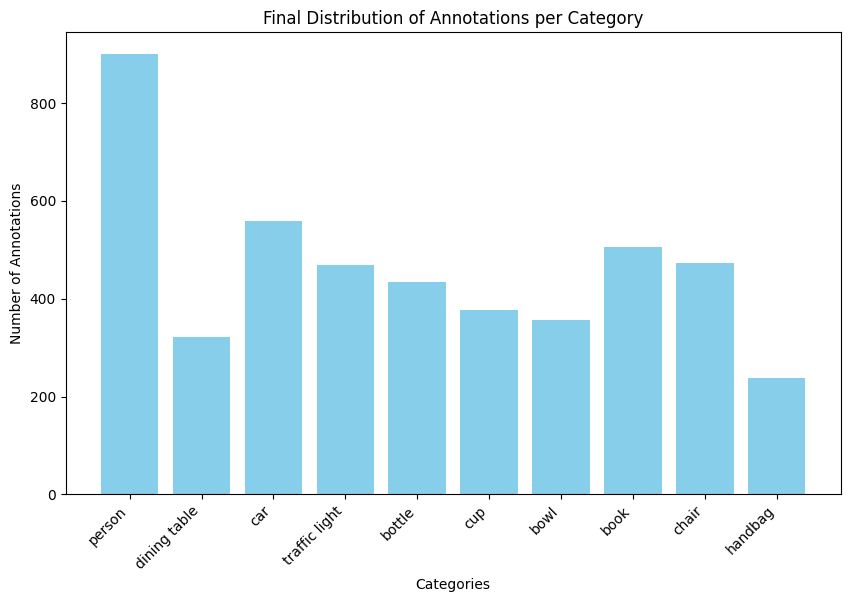

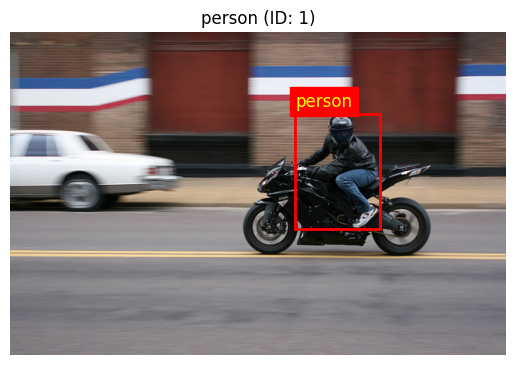

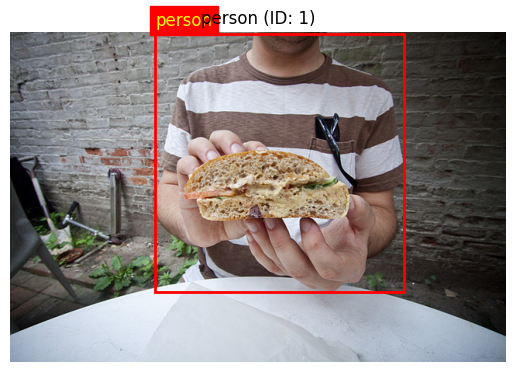

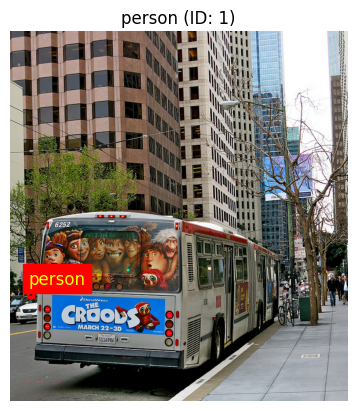

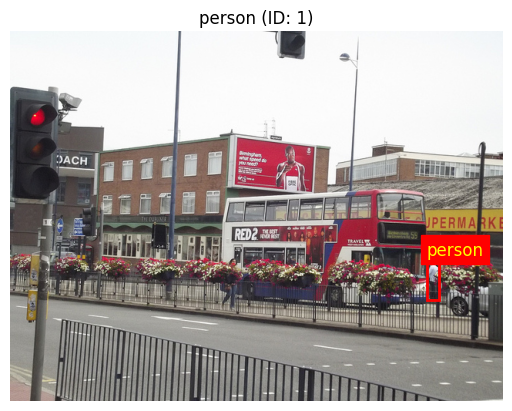

...

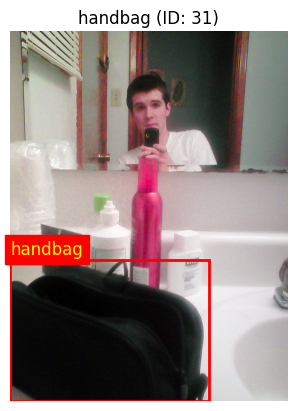

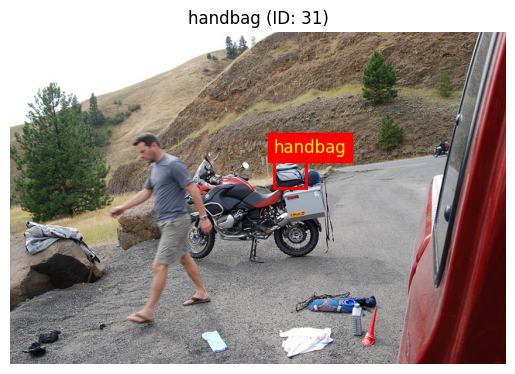

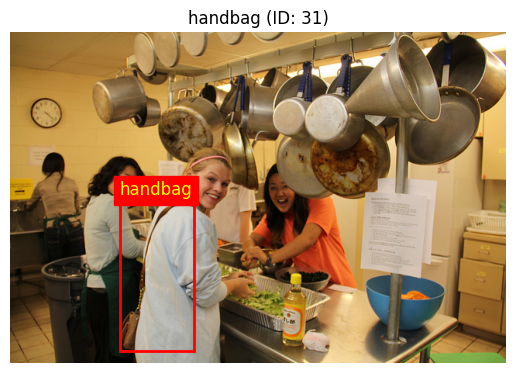

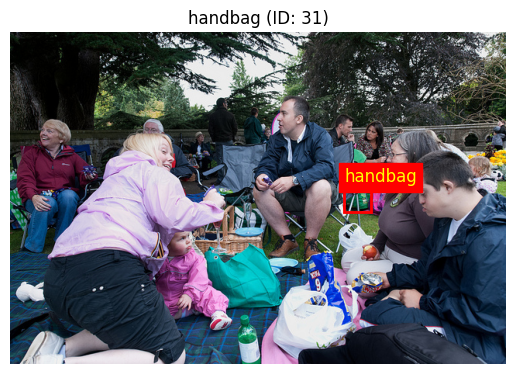

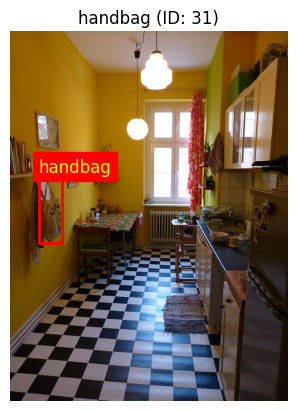

Data cleaning and preparation completed.


In [2]:
# Import necessary libraries
from google.colab import drive
import zipfile
import os
import json
from collections import Counter
import matplotlib.pyplot as plt
import random
import matplotlib.patches as patches
from PIL import Image

# Mount Google Drive
drive.mount('/content/drive')

# Paths
drive_path = "/content/drive/MyDrive"
zip_file_path = "/content/drive/MyDrive/simplified_dataset_finale.zip"
extracted_dir = "/content/simplified_dataset_finale"
annotations_path = os.path.join(extracted_dir, "annotations.json")
images_dir = os.path.join(extracted_dir, "images")

# Extract the ZIP file if not already extracted
if not os.path.exists(extracted_dir):
    os.makedirs(extracted_dir, exist_ok=True)
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extracted_dir)
    print(f"Files extracted to directory: {extracted_dir}")
else:
    print(f"Directory already exists: {extracted_dir}")

# Load annotations
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Calculate dataset statistics
num_images = len(annotations['images'])
num_annotations = len(annotations['annotations'])
num_categories = len(annotations['categories'])

print(f"Number of images: {num_images}")
print(f"Number of annotations: {num_annotations}")
print(f"Number of categories: {num_categories}")

# Explore categories
print("Categories present in the dataset:")
for category in annotations['categories']:
    print(f"- ID: {category['id']}, Name: {category['name']}")

# Map category IDs to names
id_to_name = {cat['id']: cat['name'] for cat in annotations['categories']}

# Select the categories of interest
selected_categories = {1, 3, 10, 31, 44, 47, 51, 62, 67, 84}  # IDs of the 10 categories

# Filter annotations to include only selected categories
filtered_annotations = [
    ann for ann in annotations['annotations'] if ann['category_id'] in selected_categories
]

# Count the number of bounding boxes per image
image_bbox_count = Counter([ann['image_id'] for ann in filtered_annotations])

# Keep only images with a single bounding box (images containing only one object)
single_bbox_image_ids = {image_id for image_id, count in image_bbox_count.items() if count == 1}

# Filter annotations to include only images with a single bounding box
single_bbox_annotations = [
    ann for ann in filtered_annotations if ann['image_id'] in single_bbox_image_ids
]

# Verify distribution per category
category_counts = Counter([ann['category_id'] for ann in single_bbox_annotations])
print("Initial distribution of annotations per category:")
for cat_id, count in category_counts.items():
    print(f"- {id_to_name[cat_id]}: {count}")

# Limit the number of annotations per category to a maximum of 900
final_annotations = []
for category_id in selected_categories:
    category_annotations = [ann for ann in single_bbox_annotations if ann['category_id'] == category_id]
    if len(category_annotations) > 900:
        category_annotations = random.sample(category_annotations, 900)
    final_annotations.extend(category_annotations)

# Verify updated distribution
final_category_counts = Counter([ann['category_id'] for ann in final_annotations])
print("Final distribution of annotations per category:")
for cat_id, count in final_category_counts.items():
    print(f"- {id_to_name[cat_id]}: {count}")

# Get the list of selected image IDs
selected_image_ids = {ann['image_id'] for ann in final_annotations}

# Filter images to include only selected images
filtered_images = [img for img in annotations['images'] if img['id'] in selected_image_ids]

# Update the annotations dictionary
annotations['images'] = filtered_images
annotations['annotations'] = final_annotations
annotations['categories'] = [cat for cat in annotations['categories'] if cat['id'] in selected_categories]

# Plot the distribution of annotations per category
category_names = [id_to_name[cat_id] for cat_id in final_category_counts.keys()]
category_values = list(final_category_counts.values())

plt.figure(figsize=(10, 6))
plt.bar(category_names, category_values, color='skyblue')
plt.title("Final Distribution of Annotations per Category")
plt.xticks(rotation=45, ha="right")
plt.xlabel("Categories")
plt.ylabel("Number of Annotations")
plt.show()

# Function to draw bounding boxes on images
def draw_bounding_boxes(image_path, image_annotations, id_to_name):
    # Open image
    img = Image.open(image_path).convert("RGB")
    # Create a matplotlib figure
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    # Add bounding boxes
    for ann in image_annotations:
        bbox = ann['bbox']
        category_id = ann['category_id']
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        # Add category label
        plt.text(bbox[0], bbox[1] - 10, id_to_name[category_id], color='yellow', fontsize=12, backgroundcolor='red')
    plt.axis('off')
    return ax

# Visualize images (up to 5 images per category)
category_images = {cat_id: [] for cat_id in selected_categories}
for ann in final_annotations:
    if len(category_images[ann['category_id']]) < 5:
        category_images[ann['category_id']].append(ann['image_id'])

for cat_id, image_ids in category_images.items():
    for image_id in image_ids:
        # Find the corresponding image file
        image_info = next((img for img in annotations['images'] if img['id'] == image_id), None)
        if image_info is None:
            continue
        image_file = image_info['file_name']
        image_path = os.path.join(images_dir, image_file)
        # Find annotations for the image
        image_annotations = [ann for ann in final_annotations if ann['image_id'] == image_id]
        # Draw bounding boxes
        ax = draw_bounding_boxes(image_path, image_annotations, id_to_name)
        plt.title(f"{id_to_name[cat_id]} (ID: {cat_id})")
        plt.show()

print("Data cleaning and preparation completed.")


SPLIT DATASET

In [3]:
# Assuming the necessary libraries are already imported

# Paths
annotations_path = "/content/simplified_dataset_finale/annotations.json"
images_dir = "/content/simplified_dataset_finale/images"
output_dir = "/content/filtered_dataset"
os.makedirs(output_dir, exist_ok=True)

# Load annotations
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Map of categories
id_to_name = {cat['id']: cat['name'] for cat in annotations['categories']}
selected_categories = {1, 3, 10, 31, 44, 47, 51, 62, 67, 84}  # IDs of the 10 categories

# Filter annotations with valid categories
filtered_annotations = [
    ann for ann in annotations['annotations'] if ann['category_id'] in selected_categories
]

# Count images with multiple annotations
image_bbox_count = Counter([ann['image_id'] for ann in filtered_annotations])

# Keep only images with a single bounding box
single_bbox_annotations = [
    ann for ann in filtered_annotations if image_bbox_count[ann['image_id']] == 1
]

# Verify distribution per category
category_counts = Counter([ann['category_id'] for ann in single_bbox_annotations])
print("Initial distribution of annotations:")
for cat_id, count in category_counts.items():
    print(f"- {id_to_name[cat_id]}: {count}")

# Limit to 900 annotations per category
final_annotations = []
for category_id in selected_categories:
    category_annotations = [ann for ann in single_bbox_annotations if ann['category_id'] == category_id]
    if len(category_annotations) > 900:
        category_annotations = random.sample(category_annotations, 900)
    final_annotations.extend(category_annotations)

# Verify updated distribution
final_category_counts = Counter([ann['category_id'] for ann in final_annotations])
print("Final distribution of annotations:")
for cat_id, count in final_category_counts.items():
    print(f"- {id_to_name[cat_id]}: {count}")

# Get IDs of selected images
selected_image_ids = {ann['image_id'] for ann in final_annotations}

# Create a new annotations file
filtered_dataset = {
    "images": [img for img in annotations['images'] if img['id'] in selected_image_ids],
    "annotations": final_annotations,
    "categories": [cat for cat in annotations['categories'] if cat['id'] in selected_categories]
}

# Save the new annotations file
filtered_annotations_path = os.path.join(output_dir, "annotations.json")
with open(filtered_annotations_path, 'w') as f:
    json.dump(filtered_dataset, f, indent=2)

print("Filtered dataset saved successfully!")



Initial distribution of annotations:
- book: 505
- bottle: 435
- cup: 377
- person: 1725
- bowl: 357
- dining table: 321
- handbag: 237
- chair: 474
- car: 560
- traffic light: 469
Final distribution of annotations:
- person: 900
- dining table: 321
- car: 560
- traffic light: 469
- bottle: 435
- cup: 377
- bowl: 357
- book: 505
- chair: 474
- handbag: 237
Filtered dataset saved successfully!


In [4]:
import os
import shutil
import json

# Percorsi
original_images_dir = '/content/simplified_dataset_finale/images'  # Directory con le immagini originali
filtered_annotations_path = '/content/filtered_dataset/annotations.json'
filtered_images_dir = '/content/filtered_dataset/images'

# Crea la directory per le immagini filtrate se non esiste
os.makedirs(filtered_images_dir, exist_ok=True)

# Carica le annotazioni filtrate
with open(filtered_annotations_path, 'r') as f:
    filtered_annotations = json.load(f)

# Mappa degli ID delle immagini ai nomi dei file
image_id_to_filename = {img['id']: img['file_name'] for img in filtered_annotations['images']}

# Copia le immagini corrispondenti
missing_images = []
for img_id, filename in image_id_to_filename.items():
    source_path = os.path.join('/content/simplified_dataset_finale/images', filename)
    target_path = os.path.join(filtered_images_dir, filename)

    if os.path.exists(source_path):
        shutil.copy(source_path, target_path)
    else:
        print(f"Immagine mancante nell'origine: {filename}")
        missing_images.append(img_id)

# Rimuovi le annotazioni e le informazioni sulle immagini per le immagini mancanti
if missing_images:
    print(f"Rimuovendo {len(missing_images)} immagini mancanti dalle annotazioni.")
    # Filtra le immagini
    filtered_annotations['images'] = [img for img in filtered_annotations['images'] if img['id'] not in missing_images]
    # Filtra le annotazioni
    filtered_annotations['annotations'] = [ann for ann in filtered_annotations['annotations'] if ann['image_id'] not in missing_images]

    # Salva le annotazioni aggiornate
    with open(filtered_annotations_path, 'w') as f:
        json.dump(filtered_annotations, f, indent=2)

print("Copiatura delle immagini completata e annotazioni aggiornate.")




Copiatura delle immagini completata e annotazioni aggiornate.


In [5]:
import json
import os
from sklearn.model_selection import train_test_split
from collections import Counter
import shutil

# Percorsi
annotations_path = "/content/filtered_dataset/annotations.json"
images_dir = "/content/filtered_dataset/images"
output_dir = "/content/dataset_splits"
os.makedirs(output_dir, exist_ok=True)

# Carica le annotazioni
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Mappa gli ID delle immagini agli ID delle categorie
image_id_to_category = {}
for ann in annotations['annotations']:
    image_id_to_category[ann['image_id']] = ann['category_id']

# Crea una lista di ID delle immagini e i loro corrispondenti ID di categoria
image_ids = list(image_id_to_category.keys())
category_ids = [image_id_to_category[image_id] for image_id in image_ids]

# Split stratificato (70% train, 20% val, 10% test)
train_ids, temp_ids, _, temp_labels = train_test_split(
    image_ids, category_ids, test_size=0.30, stratify=category_ids, random_state=42)

val_ids, test_ids, _, _ = train_test_split(
    temp_ids, temp_labels, test_size=0.3333, stratify=temp_labels, random_state=42)

print(f"Total images: {len(image_ids)}")
print(f"Training images: {len(train_ids)}")
print(f"Validation images: {len(val_ids)}")
print(f"Test images: {len(test_ids)}")

# Verifica distribuzione
def verify_distribution(image_ids, name):
    subset_categories = [image_id_to_category[image_id] for image_id in image_ids]
    counts = Counter(subset_categories)
    print(f"\nCategory distribution in {name} set:")
    for cat_id, count in counts.items():
        category_name = next(cat['name'] for cat in annotations['categories'] if cat['id'] == cat_id)
        print(f"- {category_name} (ID: {cat_id}): {count}")

verify_distribution(train_ids, "Training")
verify_distribution(val_ids, "Validation")
verify_distribution(test_ids, "Test")

# Copia le immagini e crea le annotazioni per ogni split
splits = {'train': train_ids, 'val': val_ids, 'test': test_ids}

for split_name, split_ids in splits.items():
    split_dir = os.path.join(output_dir, split_name)
    split_images_dir = os.path.join(split_dir, "images")
    os.makedirs(split_images_dir, exist_ok=True)

    # Filtra le immagini
    split_images = [img for img in annotations['images'] if img['id'] in split_ids]
    # Filtra le annotazioni
    split_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] in split_ids]

    # Copia le immagini
    for img in split_images:
        source_path = os.path.join(images_dir, img['file_name'])
        target_path = os.path.join(split_images_dir, img['file_name'])
        if not os.path.exists(target_path):
            if os.path.exists(source_path):
                shutil.copy(source_path, target_path)
            else:
                print(f"Immagine mancante durante lo split: {img['file_name']}")

    # Crea il file di annotazioni
    split_data = {
        "images": split_images,
        "annotations": split_annotations,
        "categories": annotations['categories']
    }
    with open(os.path.join(split_dir, "annotations.json"), 'w') as f:
        json.dump(split_data, f, indent=2)

    print(f"\n{split_name.capitalize()} set creato con {len(split_images)} immagini.")


Total images: 4635
Training images: 3244
Validation images: 927
Test images: 464

Category distribution in Training set:
- car (ID: 3): 392
- traffic light (ID: 10): 328
- person (ID: 1): 630
- bottle (ID: 44): 304
- chair (ID: 62): 332
- book (ID: 84): 353
- bowl (ID: 51): 250
- handbag (ID: 31): 166
- dining table (ID: 67): 225
- cup (ID: 47): 264

Category distribution in Validation set:
- chair (ID: 62): 95
- bottle (ID: 44): 87
- bowl (ID: 51): 71
- person (ID: 1): 180
- car (ID: 3): 112
- handbag (ID: 31): 48
- book (ID: 84): 101
- traffic light (ID: 10): 94
- dining table (ID: 67): 64
- cup (ID: 47): 75

Category distribution in Test set:
- bowl (ID: 51): 36
- car (ID: 3): 56
- chair (ID: 62): 47
- person (ID: 1): 90
- cup (ID: 47): 38
- book (ID: 84): 51
- traffic light (ID: 10): 47
- handbag (ID: 31): 23
- dining table (ID: 67): 32
- bottle (ID: 44): 44

Train set creato con 3244 immagini.

Val set creato con 927 immagini.

Test set creato con 464 immagini.


In [6]:
for split_name in ['train', 'val', 'test']:
    split_dir = os.path.join(output_dir, split_name)
    images_dir = os.path.join(split_dir, "images")
    images_in_dir = set(os.listdir(images_dir))

    with open(os.path.join(split_dir, "annotations.json"), 'r') as f:
        split_data = json.load(f)
    images_in_annotations = set(img['file_name'] for img in split_data['images'])

    missing_images = images_in_annotations - images_in_dir
    if missing_images:
        print(f"Immagini mancanti nel set {split_name}: {missing_images}")
    else:
        print(f"Tutte le immagini sono presenti nel set {split_name}.")


Tutte le immagini sono presenti nel set train.
Tutte le immagini sono presenti nel set val.
Tutte le immagini sono presenti nel set test.


DATA AUGMENTATION

Perché applicare la data augmentation solo sul set di training?
Aumentare la Diversità dei Dati di Training:

L'obiettivo principale della data augmentation è aumentare la varietà e la quantità di dati disponibili per l'addestramento senza dover raccogliere nuovi dati reali.
Questo aiuta il modello a generalizzare meglio, riducendo il rischio di overfitting (quando il modello impara troppo bene i dettagli del set di training e non generalizza bene su dati non visti).
Mantenere la Valutazione Imparziale:

I set di validazione e test devono riflettere la distribuzione reale dei dati che il modello incontrerà in applicazioni pratiche.
Se applichiamo data augmentation a questi set, alteriamo la distribuzione originale dei dati, il che potrebbe portare a una valutazione inaccurata delle prestazioni del modello.
Vogliamo che il modello sia testato su dati "non visti" e non alterati per misurare quanto bene ha imparato a generalizzare dai dati di training.
Evitare Bias nella Valutazione:

Applicando trasformazioni ai dati di validazione e test, potremmo introdurre inconsapevolmente bias o artefatti che influenzano le metriche di performance.
Questo potrebbe far sembrare che il modello performi meglio o peggio di quanto farebbe su dati reali non alterati.

In [ ]:
# Importare altre librerie necessarie
from PIL import ImageEnhance

# Directory delle immagini
images_dir = '/content/dataset_splits/train/images'

# Funzione per fare il crop delle immagini e convertire i colori
def crop_and_process_images():
    annotations_path = '/content/dataset_splits/train/annotations.json'

    # Carica le annotazioni
    with open(annotations_path, 'r') as f:
        data = json.load(f)

    # Iterare su tutte le immagini e fare il cropping basato sul bounding box
    for ann in data['annotations']:
        image_id = ann['image_id']
        img_info = next((img for img in data['images'] if img['id'] == image_id), None)

        if img_info:
            img_path = os.path.join(images_dir, img_info['file_name'])
            image = Image.open(img_path).convert("RGB")

            # Cropping del bounding box
            x_min, y_min, width, height = ann['bbox']
            x_max = x_min + width
            y_max = y_min + height
            cropped_image = image.crop((x_min, y_min, x_max, y_max))

            # Conversione in scala di grigi e miglioramento del contrasto
            gray_image = cropped_image.convert("L")
            enhancer = ImageEnhance.Contrast(gray_image)
            enhanced_image = enhancer.enhance(2.0)  # Aumentare il contrasto

            # Salvare l'immagine processata
            new_file_name = f"cropped_{img_info['file_name']}"
            enhanced_image.save(os.path.join(images_dir, new_file_name))

            # Aggiornare il file JSON con la nuova immagine croppata
            img_info['file_name'] = new_file_name
            img_info['width'] = width
            img_info['height'] = height

    # Salva le annotazioni aggiornate
    with open(annotations_path, 'w') as f:
        json.dump(data, f, indent=2)

    print("Cropping e conversione delle immagini completati.")

# Esegui il cropping e la pre-elaborazione del colore
crop_and_process_images()


In [ ]:
# Installare le librerie necessarie
!pip install --upgrade transformers datasets pycocotools

# Importare le librerie per il fine-tuning
import os
import json
import torch
from PIL import Image
from transformers import DetrFeatureExtractor, DetrForObjectDetection, Trainer, TrainingArguments
from datasets import Dataset, Features, ClassLabel, Sequence, Value
import gc

# Definire i percorsi al dataset
train_dir = '/content/dataset_splits/train'
val_dir = '/content/dataset_splits/val'

# Funzione per caricare un subset del dataset in formato COCO
def load_coco_subset(annotations_file, images_dir, max_images=200):
    with open(annotations_file, 'r') as f:
        coco = json.load(f)

    img_id2file_name = {img['id']: img['file_name'] for img in coco['images']}
    img_id2size = {img['id']: (img['width'], img['height']) for img in coco['images']}

    categories = coco['categories']
    category_id_to_name = {cat['id']: cat['name'] for cat in categories}
    category_id_to_name = dict(sorted(category_id_to_name.items()))

    category_id_to_idx = {cat_id: idx for idx, cat_id in enumerate(category_id_to_name.keys())}

    examples = []
    annotations_per_image = {}

    # Limita il numero di immagini a `max_images`
    for ann in coco['annotations']:
        if len(examples) >= max_images:
            break
        img_id = ann['image_id']
        if img_id not in annotations_per_image:
            annotations_per_image[img_id] = {'bboxes': [], 'labels': []}
        bbox = ann['bbox']
        x_min, y_min, width, height = bbox
        x_max = x_min + width
        y_max = y_min + height
        annotations_per_image[img_id]['bboxes'].append([x_min, y_min, x_max, y_max])
        annotations_per_image[img_id]['labels'].append(category_id_to_idx[ann['category_id']])

    for img_id, anns in annotations_per_image.items():
        if len(examples) >= max_images:
            break
        img_file = os.path.join(images_dir, img_id2file_name[img_id])
        width, height = img_id2size[img_id]
        example = {
            'image_id': img_id,
            'image': img_file,
            'width': width,
            'height': height,
            'bboxes': anns['bboxes'],
            'labels': anns['labels']
        }
        examples.append(example)

    return examples, list(category_id_to_name.values())

# Caricare un subset del dataset di training e validation
train_examples, class_names = load_coco_subset(
    os.path.join(train_dir, 'annotations.json'),
    os.path.join(train_dir, 'images'),
    max_images=200
)

val_examples, _ = load_coco_subset(
    os.path.join(val_dir, 'annotations.json'),
    os.path.join(val_dir, 'images'),
    max_images=50
)

# Convertire gli esempi in dizionari
def convert_examples_to_dict(examples):
    keys = examples[0].keys()
    result = {key: [] for key in keys}
    for example in examples:
        for key in keys:
            result[key].append(example[key])
    return result

train_dict = convert_examples_to_dict(train_examples)
val_dict = convert_examples_to_dict(val_examples)

# Definire le feature del dataset
num_classes = len(class_names)
class_label = ClassLabel(num_classes=num_classes, names=class_names)

features = Features({
    'image_id': Value(dtype='int64'),
    'image': Value(dtype='string'),
    'width': Value(dtype='int64'),
    'height': Value(dtype='int64'),
    'bboxes': Sequence(feature=Sequence(Value(dtype='float32'), length=4)),
    'labels': Sequence(class_label),
})

# Creare i dataset di Hugging Face
train_dataset = Dataset.from_dict(train_dict, features=features)
val_dataset = Dataset.from_dict(val_dict, features=features)

# Caricare il feature extractor per DETR
feature_extractor = DetrFeatureExtractor.from_pretrained(
    'facebook/detr-resnet-50',
    size={"shortest_edge": 320, "longest_edge": 320}
)

# Funzione di pre-processing
def preprocess_examples(examples):
    images = [Image.open(image_path).convert("RGB") for image_path in examples['image']]
    encoding = feature_extractor(images=images, annotations=examples, return_tensors="pt")
    return encoding

# Applicare la funzione di pre-processing ai dataset
train_dataset = train_dataset.map(preprocess_examples, batched=True, remove_columns=train_dataset.column_names)
val_dataset = val_dataset.map(preprocess_examples, batched=True, remove_columns=val_dataset.column_names)

# Definire il data collator
def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    labels = [item['labels'] for item in batch]
    return {'pixel_values': pixel_values, 'labels': labels}

# Caricare il modello pre-addestrato
model = DetrForObjectDetection.from_pretrained(
    'facebook/detr-resnet-50',
    num_labels=num_classes,
    ignore_mismatched_sizes=True
)

# Definire gli argomenti di addestramento con mixed precision
training_args = TrainingArguments(
    output_dir="./detr_output",
    per_device_train_batch_size=2,
    per_device_eval_batch_size=2,
    gradient_accumulation_steps=2,
    num_train_epochs=3,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="steps",
    logging_steps=20,
    learning_rate=1e-5,
    save_total


 Scegliere l'Architettura del Modello (YOLO con PyTorch)

In [ ]:
# Installare le librerie necessarie
!pip install --upgrade transformers datasets pycocotools

# Importare le librerie
import os
import json
import torch
from PIL import Image
from transformers import DetrFeatureExtractor, DetrForObjectDetection, Trainer, TrainingArguments
from datasets import Dataset, Features, ClassLabel, Sequence, Value
import gc

# Definire i percorsi al dataset
train_dir = '/content/dataset_splits/train'
val_dir = '/content/dataset_splits/val'

# Funzione per caricare un subset del dataset in formato COCO
def load_coco_subset(annotations_file, images_dir, max_images=100):
    with open(annotations_file, 'r') as f:
        coco = json.load(f)

    img_id2file_name = {img['id']: img['file_name'] for img in coco['images']}
    img_id2size = {img['id']: (img['width'], img['height']) for img in coco['images']}

    categories = coco['categories']
    category_id_to_name = {cat['id']: cat['name'] for cat in categories}
    category_id_to_name = dict(sorted(category_id_to_name.items()))

    category_id_to_idx = {cat_id: idx for idx, cat_id in enumerate(category_id_to_name.keys())}

    examples = []
    annotations_per_image = {}

    # Limita il numero di immagini a `max_images`
    for ann in coco['annotations']:
        if len(examples) >= max_images:
            break
        img_id = ann['image_id']
        if img_id not in annotations_per_image:
            annotations_per_image[img_id] = {'bboxes': [], 'labels': []}
        bbox = ann['bbox']
        x_min, y_min, width, height = bbox
        x_max = x_min + width
        y_max = y_min + height
        annotations_per_image[img_id]['bboxes'].append([x_min, y_min, x_max, y_max])
        annotations_per_image[img_id]['labels'].append(category_id_to_idx[ann['category_id']])

    for img_id, anns in annotations_per_image.items():
        if len(examples) >= max_images:
            break
        img_file = os.path.join(images_dir, img_id2file_name[img_id])
        width, height = img_id2size[img_id]
        example = {
            'image_id': img_id,
            'image': img_file,
            'width': width,
            'height': height,
            'bboxes': anns['bboxes'],
            'labels': anns['labels']
        }
        examples.append(example)

    return examples, list(category_id_to_name.values())

# Caricare un subset del dataset di training e validation (limitato a 100 immagini per testing)
train_examples, class_names = load_coco_subset(
    os.path.join(train_dir, 'annotations.json'),
    os.path.join(train_dir, 'images'),
    max_images=100  # Limita il numero di immagini per risparmiare memoria
)

val_examples, _ = load_coco_subset(
    os.path.join(val_dir, 'annotations.json'),
    os.path.join(val_dir, 'images'),
    max_images=50  # Limita il numero di immagini per risparmiare memoria
)

# Convertire gli esempi in dizionari
def convert_examples_to_dict(examples):
    keys = examples[0].keys()
    result = {key: [] for key in keys}
    for example in examples:
        for key in keys:
            result[key].append(example[key])
    return result

train_dict = convert_examples_to_dict(train_examples)
val_dict = convert_examples_to_dict(val_examples)

# Definire le feature del dataset
num_classes = len(class_names)
class_label = ClassLabel(num_classes=num_classes, names=class_names)

features = Features({
    'image_id': Value(dtype='int64'),
    'image': Value(dtype='string'),
    'width': Value(dtype='int64'),
    'height': Value(dtype='int64'),
    'bboxes': Sequence(feature=Sequence(Value(dtype='float32'), length=4)),
    'labels': Sequence(class_label),
})

# Creare i dataset di Hugging Face
train_dataset = Dataset.from_dict(train_dict, features=features)
val_dataset = Dataset.from_dict(val_dict, features=features)

# Funzione per fare il crop delle immagini utilizzando i bounding boxes
def crop_bounding_box(image_path, bbox):
    """Ritaglia la regione di un'immagine definita dal bounding box."""
    image = Image.open(image_path).convert("RGB")
    x_min, y_min, x_max, y_max = bbox
    cropped_image = image.crop((x_min, y_min, x_max, y_max))
    return cropped_image

# Funzione di pre-processing per ogni batch, incluso il cropping
def preprocess_examples(examples):
    cropped_images = []
    batch_annotations = []

    for i in range(len(examples['image'])):
        image_path = examples['image'][i]
        bboxes = examples['bboxes'][i]
        labels = examples['labels'][i]

        # Crop l'immagine per ogni bounding box
        for bbox, label in zip(bboxes, labels):
            cropped_image = crop_bounding_box(image_path, bbox)
            cropped_images.append(cropped_image)

            # Aggiorna le annotazioni per l'immagine ritagliata
            batch_annotations.append({
                'labels': label
            })

    # Pre-processare le immagini ritagliate
    encoding = feature_extractor(images=cropped_images, return_tensors="pt")
    encoding['labels'] = torch.tensor([ann['labels'] for ann in batch_annotations], dtype=torch.long)

    return encoding

# Applicare la funzione di pre-processing ai dataset
train_dataset = train_dataset.map(preprocess_examples, batched=True, remove_columns=train_dataset.column_names)
val_dataset = val_dataset.map(preprocess_examples, batched=True, remove_columns=val_dataset.column_names)

# Definire il data collator
def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    labels = torch.tensor([item['labels'] for item in batch], dtype=torch.long)
    return {'pixel_values': pixel_values, 'labels': labels}

# Caricare il modello pre-addestrato
model = DetrForObjectDetection.from_pretrained(
    'facebook/detr-resnet-50',
    num_labels=num_classes,
    ignore_mismatched_sizes=True
)

# Definire gli argomenti di addestramento con mixed precision
training_args = TrainingArguments(
    output_dir="./detr_output",
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    gradient_accumulation_steps=2,
    num_train_epochs=3,  # Ridurre le epoche per testare velocemente
    evaluation_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="steps",
    logging_steps=20,
    learning_rate=1e-5,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=False,
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    fp16=True,
)

# Creare il Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
)

# Pulire la cache di memoria prima dell'addestramento
gc.collect()
torch.cuda.empty_cache()

# Iniziare l'addestramento
trainer.train()
